First we would load the image list from the json file

In [1]:
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import  Image, ImageDraw
from sklearn.neighbors import KernelDensity
from sklearn.neighbors import NearestNeighbors
import cv2 as cv

# Reading map data

### Reading map data from the dataset

In [2]:
json_file = open(r'E:\Semester_Projects\BnF-jadis.github.io-master\assets\data\df_website.json', "r", encoding="utf-8")
image_list = json.load(json_file)
json_file.close()

new_string = json.dumps(image_list, indent=2, ensure_ascii=False)

arks = []
urls = []
titles = []
dates = []
geolocalisations = []

for item in image_list:
    arks.append(item["ark"])
    titles.append(item["title"])
    dates.append(item["date"])
    geolocalisations.append(item["geolocalisation"])
    

Here would be the histogram of the dates of the maps we have, printed is the year with the most maps in the dataset

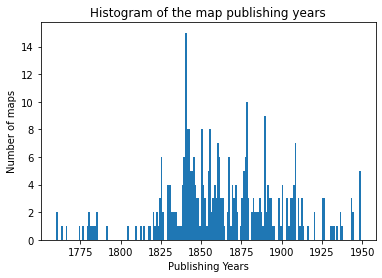

1840


In [3]:
year_duration = list(range(np.min(dates), np.max(dates)+1))
hist_returned = plt.hist(dates, bins=year_duration)
plt.xlabel('Publishing Years')
plt.ylabel('Number of maps')
plt.title('Histogram of the map publishing years')
plt.show()
print(hist_returned[1][np.argmax(hist_returned[0])])

In [4]:
print(min(dates))
print(max(dates))
print(len(dates))

1760
1949
340


Selected the maps for a specific year

In [5]:
selected_year = [1839, 1840, 1841, 1842]
selected_maps = []
selected_map_data = []
for i in range(len(titles)):
    if dates[i] in selected_year:
        selected_maps.append(image_list[i])
        ark = arks[i]
        file_path = r'E:\Semester_Projects\BnF-jadis.github.io-master\export\vectorized\{}f1.json'.format(ark)
        json_file = open(file_path)
        selected_map_data.append(json.load(json_file))
        json_file.close()
print("Number of selcted maps is", len(selected_maps))

Number of selcted maps is 37


Find out the range of the latitudes and longitudes of the selected maps

In [6]:
latitudes = []
longitudes = []
for i in range(len(selected_maps)):
    geolocalisation = selected_maps[i]["geolocalisation"]
    for i in range(4):
        latitudes.append(geolocalisation[i][0])
        longitudes.append(geolocalisation[i][1])
        
latitude_span = max(latitudes)-min(latitudes)
longtitue_span = max(longitudes)-min(longitudes)
print(max(latitudes), min(latitudes), max(longitudes), min(longitudes))
print(latitude_span, longtitue_span)

48.89784689855318 48.80414667129867 2.433331648036194 2.2543690372328737
0.09370022725451577 0.1789626108033202


### Reading reference map data

Read out the reference map

In [7]:
reference_file_path = r'E:\OneDrive - HKUST Connect\Course Documents\2022 Spring EPFL\Project\Semester Project\Program\paris.json'
reference_json_file = open(reference_file_path)
reference_map_data = json.load(reference_json_file)

Find out the range of the latitudes and longitudes of the reference maps

In [8]:
latitudes_reference = []
longitudes_reference = []

for i in range(len(reference_map_data)):
    latitudes_reference.append(reference_map_data[i][0][0])
    latitudes_reference.append(reference_map_data[i][1][0])
    longitudes_reference.append(reference_map_data[i][0][1])
    longitudes_reference.append(reference_map_data[i][1][1])
    
print(max(latitudes_reference), min(latitudes_reference), max(longitudes_reference), min(longitudes_reference))

48.8888248 48.82468659352064 2.4136323 2.2756968


# Drawing the map

Define the function to transfer the latitudes and longitudes

In [9]:
def transfer(lontitude, latitude, canvas_size):
    max_latitudes = max(latitudes)
    min_longitudes = min(longitudes)
    # print(max_latitudes, min_longitudes)
    transfered_latitude = (max_latitudes - latitude) / longtitue_span * canvas_size / np.cos(np.deg2rad(48.51))
    transfered_lontitude = (lontitude - min_longitudes) / longtitue_span * canvas_size
    # print(transfered_latitude, transfered_lontitude)
    return int(transfered_lontitude), int(transfered_latitude)

### Drawing the reference map

In [10]:
canvas_size = 10000
canvas = np.zeros((canvas_size, canvas_size)).astype('uint8')

reference_map = canvas

print("Drawing map")

img = Image.fromarray(canvas)
draw = ImageDraw.Draw(img)
for vector in reference_map_data:
    draw.line(np.ravel([transfer(
        y, x, canvas_size) for (x, y) in vector]).tolist(), fill=1)
reference_map = np.array(img)

kernel = np.ones((4,4),np.uint8)

reference_map_dilated = cv.dilate(reference_map * 255, kernel, iterations = 1)
reference_map_blured = cv.GaussianBlur(reference_map_dilated,(5,5), 0)

print("The shape of reference_map is", reference_map.shape)
print("The maximum of reference_map is", np.max(reference_map))

Drawing map
The shape of reference_map is (10000, 10000)
The maximum of reference_map is 1


#### Test reference map

In [ ]:
Image.fromarray(reference_map_blured)

#### Get the key points of the reference map

In [12]:
MAX_MATCHES = 500
GOOD_MATCH_PERCENT = 0.15

points0 = []

orb = cv.ORB_create(MAX_MATCHES)
r_keypoints, r_descriptors = orb.detectAndCompute(reference_map_blured, None)

for point in r_keypoints:
    points0.append(point.pt)

### Draw maps from the dataset on blank canvas

In [13]:
canvas_size = 10000

canvas = np.zeros((canvas_size, canvas_size)).astype('uint8')

maps = []
blured_maps = []
d_map = canvas
kernel = np.ones((4,4),np.uint8)

print("Drawing map")
for i, map_data in enumerate(selected_map_data):
    print(i, end=" ")
    img = Image.fromarray(canvas)
    draw = ImageDraw.Draw(img)
    for vector in map_data:
        draw.line(np.ravel([transfer(
            y, x, canvas_size) for (x, y) in vector]).tolist(), fill=1)
    current_map = np.array(img)
    
    dilated = cv.dilate(current_map * 255, kernel, iterations = 1)
    blured = cv.GaussianBlur(dilated,(5,5), 0)
    normalized = blured / np.max(blured)
    
    maps.append(current_map)
    blured_maps.append(blured)
    d_map = normalized + d_map

print("\nThe shape of d_map is ", d_map.shape)
print("The maximum of d_map is, ", np.max(d_map))

Drawing map
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 
The shape of d_map is  (10000, 10000)
The maximum of d_map is,  17.83137254901961


### Report purpose:

In [18]:
mapA_report = selected_maps[0]
sever_a, identifier_a = mapA_report["ark"].split('_')
url_a = "https://gallica.bnf.fr/iiif/ark:/{}/{}/f1/full/full/0/native.jpg".format(sever_a, identifier_a)
print(url_a)
print(mapA_report["title"])

mapA = maps[0]
dilated_a = cv.dilate(mapA * 255, kernel, iterations = 1)
Image.fromarray(dilated_a).save("mapA_diated.png")

https://gallica.bnf.fr/iiif/ark:/12148/btv1b53087732w/f1/full/full/0/native.jpg
Nouveau plan routier de la ville de Paris


In [26]:
mapB_report = selected_maps[1]
sever_b, identifier_b = mapB_report["ark"].split('_')
url_b = "https://gallica.bnf.fr/iiif/ark:/{}/{}/f1/full/full/0/native.jpg".format(sever_b, identifier_b)
print(url_b)
print(mapB_report["title"])

mapB = maps[1]
dilated_b = cv.dilate(mapB * 255, kernel, iterations = 1)
Image.fromarray(dilated_b).save("mapB_diated.png")

https://gallica.bnf.fr/iiif/ark:/12148/btv1b53085185b/f1/full/full/0/native.jpg
Nouveau plan routier de la ville de Paris


### Allign the first map with the reference

#### Preperation

Generate keypoints

In [13]:
keypoints1, descriptors1 = orb.detectAndCompute(blured_maps[0], None)

points1 = []
for point in keypoints1:
    points1.append(point.pt)

Find the neighboring keypoints indices of each keypoint

In [14]:
neigh = NearestNeighbors(radius=250)
neigh.fit(points0)
neighboring_indicies = neigh.radius_neighbors(points1, return_distance=False)

Sort the indices according to the descriptor similarity

In [15]:
sorted_neighboring_indicies = np.copy(neighboring_indicies)
similarities = np.copy(neighboring_indicies)

for i, neighboring_indicie in enumerate(neighboring_indicies):
    if not np.any(neighboring_indicie):
        continue        
    similarity = np.dot(r_descriptors[neighboring_indicie], descriptors1[i])
    sorted_neighboring_indicies[i] = np.flipud(neighboring_indicie[np.argsort(similarity)])
    similarities[i] = np.flipud(similarity)

Prepare the data for cross check

In [16]:
neigh1 = NearestNeighbors(radius=250)
neigh1.fit(points1)
c_neighboring_indicies = neigh1.radius_neighbors(points0, return_distance=False)

c_sorted_neighboring_indicies = np.copy(c_neighboring_indicies)
c_similarities = np.copy(c_neighboring_indicies)

for i, neighboring_indicie in enumerate(c_neighboring_indicies):
    if not np.any(neighboring_indicie):
        continue        
    similarity = np.dot(descriptors1[neighboring_indicie], r_descriptors[i])
    c_sorted_neighboring_indicies[i] = np.flipud(neighboring_indicie[np.argsort(similarity)])
    c_similarities[i] = np.flipud(similarity)

Perform cross check and output the matches according to the performs

In [24]:
match_similarities = []
match_indecies_pairs = []

for i, neighboring_indicie in enumerate(neighboring_indicies):
    if not np.any(neighboring_indicie):
        continue
    best_match = neighboring_indicie[0]
    if not np.any(c_sorted_neighboring_indicies[best_match]):
        continue
    if i == c_sorted_neighboring_indicies[best_match][0]:
        match_indecies_pairs.append(tuple([best_match, i])) # (reference_map_point, other_map_point)
        match_similarities.append(similarities[i][0])
        
sorted_match_similarities = np.flipud(np.sort(match_similarities))
sorted_match_indecies_pairs = np.flipud(np.array(match_indecies_pairs)[np.argsort(match_similarities)])

#### Performing allignment of first map

In [32]:
num_matches = np.sum(sorted_match_similarities > 200)

reference_points = []
process_points = []

for i in range(num_matches):
    reference_points.append(points0[sorted_match_indecies_pairs[i][0]])
    process_points.append(points1[sorted_match_indecies_pairs[i][1]])

In [38]:
h, mask = cv.findHomography(np.array(process_points), np.array(reference_points), cv.RANSAC)

height, width = reference_map_blured.shape
Alligned = cv.warpPerspective(blured_maps[0], h, (width, height))

In [43]:
Image.fromarray(Alligned + reference_map_blured)

In [42]:
Image.fromarray(blured_maps[0] + reference_map_blured)

### Allignment function

In [48]:
def allign(im1, imr):
    
    ## Get the key points of the reference map
    MAX_MATCHES = 500
    GOOD_MATCH_PERCENT = 0.15

    points0 = []
    orb = cv.ORB_create(MAX_MATCHES)
    r_keypoints, r_descriptors = orb.detectAndCompute(imr, None)

    for point in r_keypoints:
        points0.append(point.pt)
    print(len(r_keypoints))
    ## Get the key points of the target map
    keypoints1, descriptors1 = orb.detectAndCompute(im1, None)

    points1 = []
    for point in keypoints1:
        points1.append(point.pt)
        
    ## Find the neighboring keypoints indices of each target keypoint
    neigh = NearestNeighbors(radius=250)
    neigh.fit(points0)
    neighboring_indicies = neigh.radius_neighbors(points1, return_distance=False)
    
    ## Sort the indices according to the descriptor similarity
    sorted_neighboring_indicies = np.copy(neighboring_indicies)
    similarities = np.copy(neighboring_indicies)

    for i, neighboring_indicie in enumerate(neighboring_indicies):
        if not np.any(neighboring_indicie):
            continue        
        similarity = np.dot(r_descriptors[neighboring_indicie], descriptors1[i])
        sorted_neighboring_indicies[i] = np.flipud(neighboring_indicie[np.argsort(similarity)])
        similarities[i] = np.flipud(similarity)
        
    ## Prepare the data for cross check
    neigh1 = NearestNeighbors(radius=250)
    neigh1.fit(points1)
    c_neighboring_indicies = neigh1.radius_neighbors(points0, return_distance=False)

    c_sorted_neighboring_indicies = np.copy(c_neighboring_indicies)
    c_similarities = np.copy(c_neighboring_indicies)

    for i, neighboring_indicie in enumerate(c_neighboring_indicies):
        if not np.any(neighboring_indicie):
            continue        
        similarity = np.dot(descriptors1[neighboring_indicie], r_descriptors[i])
        c_sorted_neighboring_indicies[i] = np.flipud(neighboring_indicie[np.argsort(similarity)])
        c_similarities[i] = np.flipud(similarity)
    
    ## Perform cross check and output the matches according to the performs
    match_similarities = []
    match_indecies_pairs = []

    for i, neighboring_indicie in enumerate(neighboring_indicies):
        if not np.any(neighboring_indicie):
            continue
        best_match = neighboring_indicie[0]
        if not np.any(c_sorted_neighboring_indicies[best_match]):
            continue
        if i == c_sorted_neighboring_indicies[best_match][0]:
            match_indecies_pairs.append(tuple([best_match, i])) # (reference_map_point, other_map_point)
            match_similarities.append(similarities[i][0])

    sorted_match_similarities = np.flipud(np.sort(match_similarities))
    sorted_match_indecies_pairs = np.flipud(np.array(match_indecies_pairs)[np.argsort(match_similarities)])
    
    # Allign the map
    num_matches = np.sum(sorted_match_similarities > 200)

    reference_points = []
    process_points = []

    for i in range(num_matches):
        reference_points.append(points0[sorted_match_indecies_pairs[i][0]])
        process_points.append(points1[sorted_match_indecies_pairs[i][1]])
        
    h, mask = cv.findHomography(np.array(process_points), np.array(reference_points), cv.RANSAC)

    height, width = imr.shape
    alligned = cv.warpPerspective(im1, h, (width, height))
    return alligned

In [49]:
map1 = maps[0]
map2 = maps[1]
alligned_map2 = allign(map2, map1)

0


ValueError: Expected 2D array, got 1D array instead:
array=[].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.